In [19]:
import numpy as np
import pandas as pd
import pydicom
from glob import glob
from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib import patches as patches
import cv2
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly import tools
from plotly.graph_objs import *
from plotly.graph_objs.layout import Margin, YAxis, XAxis
import seaborn as sns

init_notebook_mode()


This competition provides a library for masking. I will go more in depth into what masking is in later part of this competition. For now, we import this library in a hacky way below, by adding the path into our system.

In [4]:
def mask2rle(img, width, height):
    rle = []
    lastColor = 0;
    currentPixel = 0;
    runStart = -1;
    runLength = 0;

    for x in range(width):
        for y in range(height):
            currentColor = img[x][y]
            if currentColor != lastColor:
                if currentColor == 255:
                    runStart = currentPixel;
                    runLength = 1;
                else:
                    rle.append(str(runStart));
                    rle.append(str(runLength));
                    runStart = -1;
                    runLength = 0;
                    currentPixel = 0;
            elif runStart > -1:
                runLength += 1
            lastColor = currentColor;
            currentPixel+=1;

    return " ".join(rle)

def rle2mask(rle, width, height):
    mask= np.zeros(width* height)
    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]
    lengths = array[1::2]

    current_position = 0
    for index, start in enumerate(starts):
        current_position += start
        mask[current_position:current_position+lengths[index]] = 255
        current_position += lengths[index]

    return mask.reshape(width, height)


In [37]:
rles_df = pd.read_csv('archive/train-rle.csv')
rles_df.columns = ['ImageId', 'EncodedPixels']
rles_df.sample(2)

,ImageId,EncodedPixels
2234,1.2.276.0.7230010.3.1.4.8323329.4554.151787518...,-1
926,1.2.276.0.7230010.3.1.4.8323329.13612.15178752...,-1


In [6]:
def dicom_to_dict(dicom_data, file_path, rles_df, encoded_pixels=True):

    data = {}
    
    data['patient_name'] = dicom_data.PatientName
    data['patient_id'] = dicom_data.PatientID
    data['patient_age'] = int(dicom_data.PatientAge)
    data['patient_sex'] = dicom_data.PatientSex
    data['pixel_spacing'] = dicom_data.PixelSpacing
    data['file_path'] = file_path
    data['id'] = dicom_data.SOPInstanceUID
    
    if encoded_pixels:
        encoded_pixels_list = rles_df[rles_df['ImageId']==dicom_data.SOPInstanceUID]['EncodedPixels'].values
       
        pneumothorax = False
        for encoded_pixels in encoded_pixels_list:
            if encoded_pixels != ' -1':
                pneumothorax = True
        
        data['encoded_pixels_list'] = encoded_pixels_list
        data['has_pneumothorax'] = pneumothorax
        data['encoded_pixels_count'] = len(encoded_pixels_list)
        
    return data

In [11]:
def read_metadata(dicoms_path):
    train_fns = sorted(glob(dicoms_path))
    train_metadata_df = pd.DataFrame()
    train_metadata_list = []
    for file_path in tqdm(train_fns):
        dicom_data = pydicom.dcmread(file_path)
        train_metadata = dicom_to_dict(dicom_data, file_path, rles_df)
        train_metadata_list.append(train_metadata)
    train_metadata_df = pd.DataFrame(train_metadata_list)
    return train_metadata_df


In [38]:
train_metadata_df = read_metadata('archive/dicom-images-train/*/*/*.dcm')

100%|██████████| 10712/10712 [00:11<00:00, 902.67it/s]


In [39]:
test_metadata_df = read_metadata('archive/dicom-images-test/*/*/*.dcm')

100%|██████████| 1377/1377 [00:01<00:00, 908.95it/s]


## Section 2: Visualizing The Chest X-Ray 


## Saple images

In [ ]:
num_img = 4
subplot_count = 0
fig, ax = plt.subplots(nrows=1, ncols=num_img, sharey=True, figsize=(num_img*10,10))
for index, row in train_metadata_df.sample(n=num_img).iterrows():
    dataset = pydicom.dcmread(row['file_path'])
    ax[subplot_count].imshow(dataset.pixel_array, cmap=plt.cm.bone)
    ax[subplot_count].text(0,0,'Age:{}, Sex: {}, Pneumothorax: {}'.format(row['patient_age'],row['patient_sex'],row['has_pneumothorax']),
                           size=26,color='white', backgroundcolor='black')
    subplot_count += 1

In [17]:
def bounding_box(img):
    rows = np.any(img, axis=1)
    cols = np.any(img, axis=0)
    rmin, rmax = np.where(rows)[0][[0, -1]]
    cmin, cmax = np.where(cols)[0][[0, -1]]

    return rmin, rmax, cmin, cmax

def plot_with_mask_and_bbox(file_path, mask_encoded_list, figsize=(20,10)):
    
    pixel_array = pydicom.dcmread(file_path).pixel_array
    
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(16, 16))
    clahe_pixel_array = clahe.apply(pixel_array)
    
    mask_decoded_list = [rle2mask(mask_encoded, 1024, 1024).T for mask_encoded in mask_encoded_list]
    
    fig, ax = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(20,10))
    
    ax[0].imshow(pixel_array, cmap=plt.cm.bone)
    for mask_decoded in mask_decoded_list:
        ax[0].imshow(mask_decoded, alpha=0.3, cmap="Reds")
        rmin, rmax, cmin, cmax = bounding_box(mask_decoded)
        bbox = patches.Rectangle((cmin,rmin),cmax-cmin,rmax-rmin,linewidth=1,edgecolor='r',facecolor='none')
        ax[0].add_patch(bbox)
    ax[0].set_title('With Mask')
    
    ax[1].imshow(clahe_pixel_array, cmap=plt.cm.bone)
    for mask_decoded in mask_decoded_list:
        rmin, rmax, cmin, cmax = bounding_box(mask_decoded)
        bbox = patches.Rectangle((cmin,rmin),cmax-cmin,rmax-rmin,linewidth=1,edgecolor='r',facecolor='none')
        ax[1].add_patch(bbox)
    ax[1].set_title('Without Mask - Clahe')
    
    # plot plain xray with just bounding box and no mask
    ax[2].imshow(pixel_array, cmap=plt.cm.bone)
    for mask_decoded in mask_decoded_list:
        rmin, rmax, cmin, cmax = bounding_box(mask_decoded)
        bbox = patches.Rectangle((cmin,rmin),cmax-cmin,rmax-rmin,linewidth=1,edgecolor='r',facecolor='none')
        ax[2].add_patch(bbox)
    ax[2].set_title('Without Mask')
    plt.show()

# visualization of input images with bouding box around pneumothorax

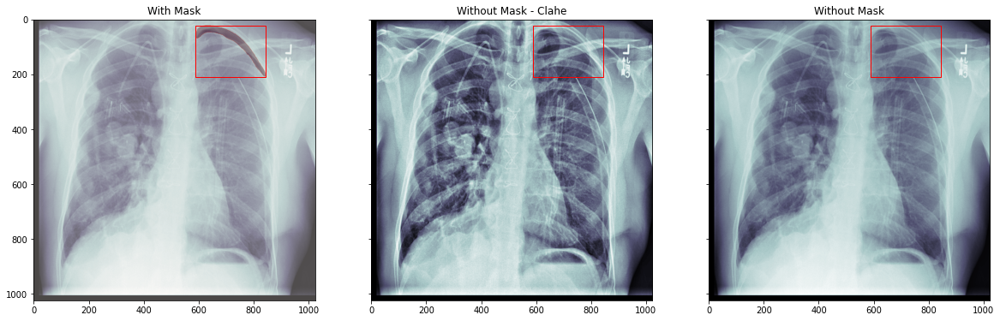

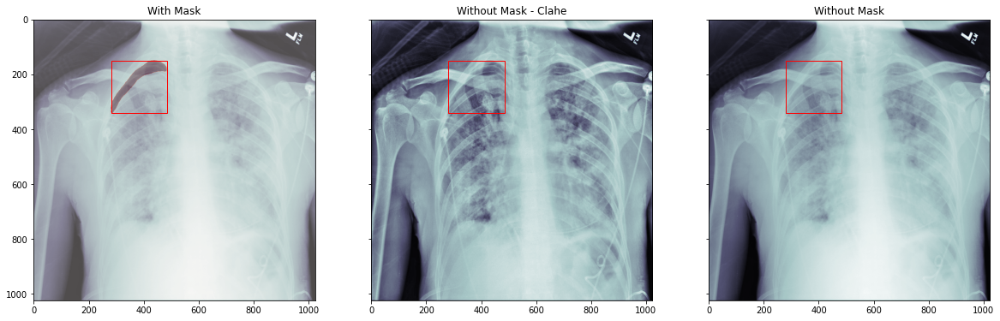

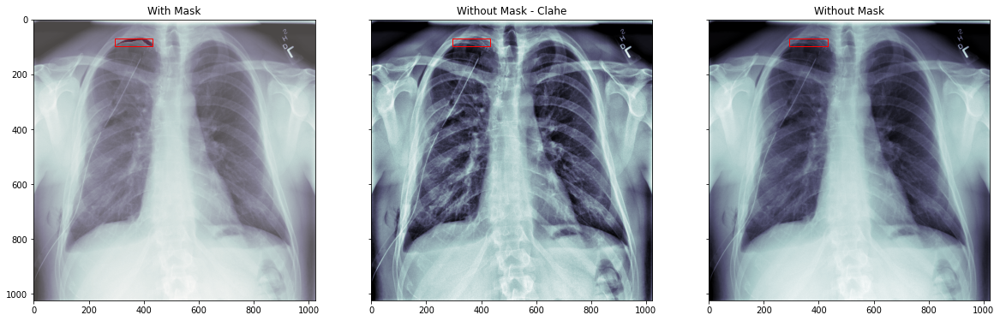

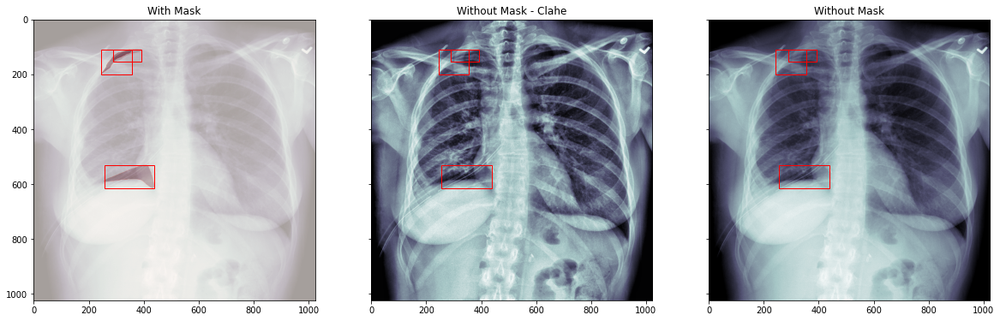

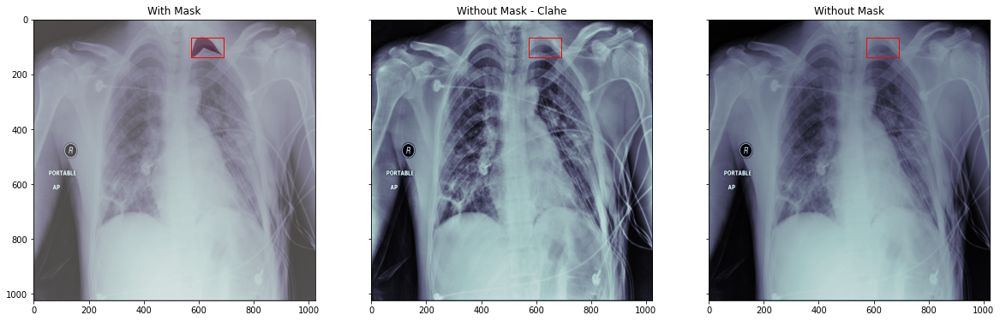

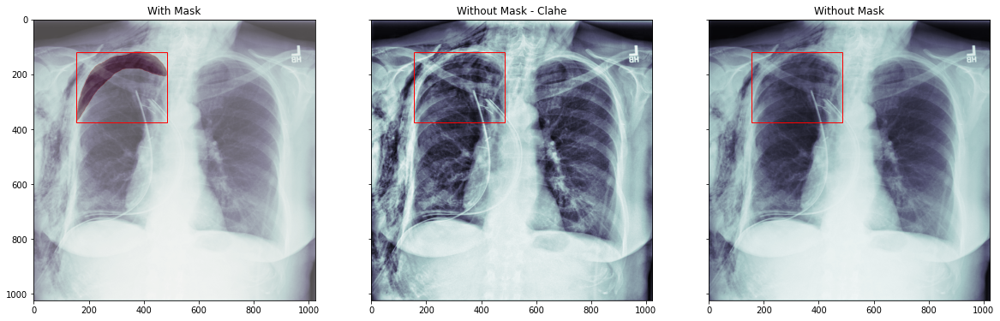

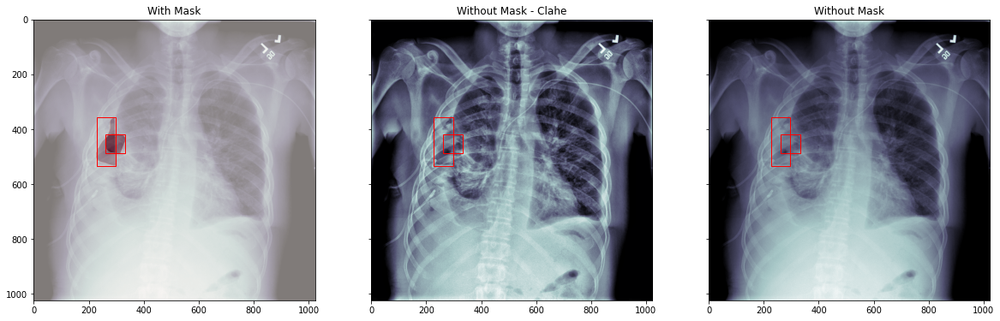

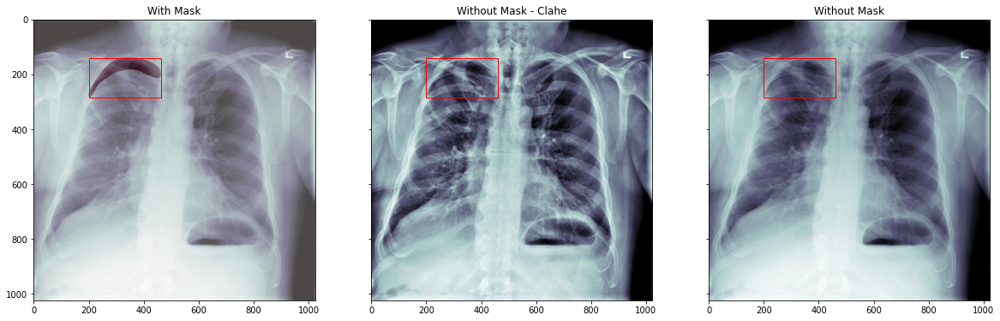

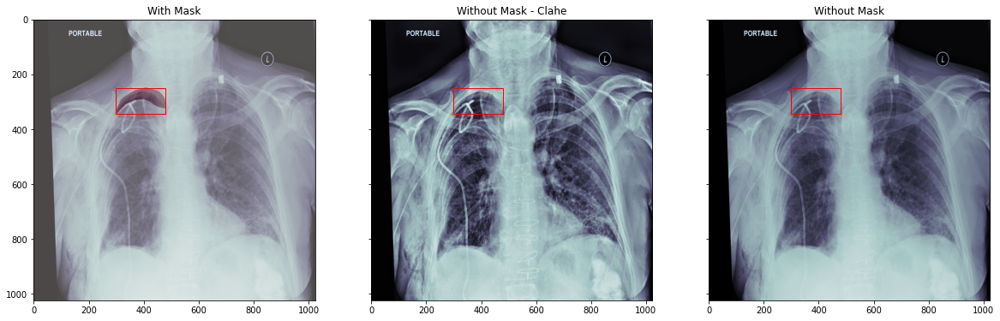

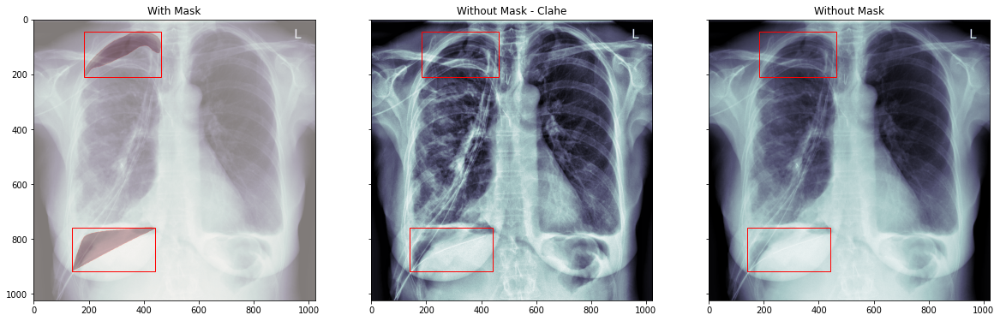

In [18]:
train_metadata_sample = train_metadata_df[train_metadata_df['has_pneumothorax']==1].sample(n=10)
for index, row in train_metadata_sample.iterrows():
    file_path = row['file_path']
    mask_encoded_list = row['encoded_pixels_list']
    plot_with_mask_and_bbox(file_path, mask_encoded_list)

In [41]:
# when looking at the GT bounding box, we can see that its difficult to find pneumothorax. 

## Section 3: Explore The Metadata

### Annotation / Mask / Label

First thing first, let's take a look at the annotation and see how our data is distributed over positive and negative instances.

In [42]:
# print missing annotation
missing_vals = train_metadata_df[train_metadata_df['encoded_pixels_count']==0]['encoded_pixels_count'].count()
print("Number of x-rays with missing labels: {}".format(missing_vals))

Number of x-rays with missing labels: 37


In [43]:
nok_count = train_metadata_df['has_pneumothorax'].sum()
ok_count = len(train_metadata_df) - nok_count
x = ['No Pneumothorax','Pneumothorax']
y = [ok_count, nok_count]
trace0 = Bar(x=x, y=y, name = 'Ok vs Not OK')
nok_encoded_pixels_count = train_metadata_df[train_metadata_df['has_pneumothorax']==1]['encoded_pixels_count'].values
trace1 = Histogram(x=nok_encoded_pixels_count, name='# of annotations')
fig = tools.make_subplots(rows=1, cols=2)
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig['layout'].update(height=400, width=900, title='Pneumothorax Instances')
iplot(fig)

/home/gabib/anaconda3/envs/rs1/lib/python3.6/site-packages/plotly/tools.py:464: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



### the dataset is biased to negative(No Pneumothorax) images 

### Age, Sex, and Pneumothorax

In [46]:
pneumo_pat_age = train_metadata_df[train_metadata_df['has_pneumothorax']==1]['patient_age'].values
no_pneumo_pat_age = train_metadata_df[train_metadata_df['has_pneumothorax']==0]['patient_age'].values

<AxesSubplot:xlabel='patient_age', ylabel='Count'>

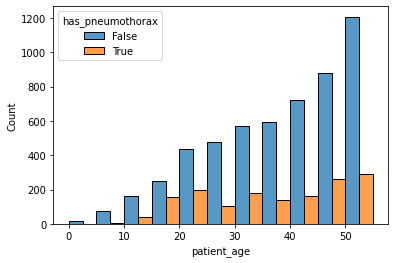

In [61]:
sns.histplot(data=train_metadata_df, x="patient_age", hue="has_pneumothorax", multiple="dodge", bins=range(0, 60, 5))


### no positive cases in ages less than 5 and very few with less than 20. 
### we can see that the the higher the ages the higher the number of scans that we have although the ### number of positive 
### is not increasing similarly so the have more biased dataset for higher ages. 


In [24]:
trace1 = Box(x=pneumo_pat_age, name='has pneumothorax')
trace2 = Box(x=no_pneumo_pat_age[no_pneumo_pat_age <= 120], name='no pneumothorax')
data = [trace1, trace2]
iplot(data)

### additional view of ages distribution with and without pneumothorax


In [62]:
train_male_df = train_metadata_df[train_metadata_df['patient_sex']=='M']
train_female_df = train_metadata_df[train_metadata_df['patient_sex']=='F']

In [63]:
male_ok_count = len(train_male_df[train_male_df['has_pneumothorax']==0])
female_ok_count = len(train_female_df[train_female_df['has_pneumothorax']==0])
male_nok_count = len(train_male_df[train_male_df['has_pneumothorax']==1])
female_nok_count = len(train_female_df[train_female_df['has_pneumothorax']==1])

In [64]:
ok = Bar(x=['male', 'female'], y=[male_ok_count, female_ok_count], name='no pneumothorax')
nok = Bar(x=['male', 'female'], y=[male_nok_count, female_nok_count], name='has pneumothorax')

data = [ok, nok]
layout = Layout(barmode='stack', height=400)

fig = Figure(data=data, layout=layout)
iplot(fig, filename='stacked-bar')

### distribution over males and females.
### we have more male scans (not significant) but the % of positive negatuve looks similar

In [66]:
m_pneumo_labels = ['no pneumothorax','has pneumothorax']
f_pneumo_labels = ['no pneumothorax','has pneumothorax']
m_pneumo_values = [male_ok_count, male_nok_count]
f_pneumo_values = [female_ok_count, female_nok_count]
colors = ['#FEBFB3', '#E1396C']

In [67]:
# original source code: https://plot.ly/python/pie-charts/#donut-chart

fig = {
  "data": [
    {
      "values": m_pneumo_values,
      "labels": m_pneumo_labels,
      "domain": {"column": 0},
      "name": "Male",
      "hoverinfo":"label+percent",
      "hole": .4,
      "type": "pie"
    },
    {
      "values": f_pneumo_values,
      "labels": f_pneumo_labels,
      "textposition":"inside",
      "domain": {"column": 1},
      "name": "Female",
      "hoverinfo":"label+percent",
      "hole": .4,
      "type": "pie"
    }],
  "layout": {
        "title":"Pneumothorax - Male vs Female",
        "grid": {"rows": 1, "columns": 2},
        "annotations": [
            {
                "font": {
                    "size": 20
                },
                "showarrow": False,
                "text": "Male",
                "x": 0.20,
                "y": 0.5
            },
            {
                "font": {
                    "size": 20
                },
                "showarrow": False,
                "text": "Female",
                "x": 0.8,
                "y": 0.5
            }
        ]
    }
}
iplot(fig)

### another view of male female distribution 

In [68]:
def get_affected_area(encoded_pixels_list, pixel_spacing):
    
    # take the encoded mask, decode, and get the sum of nonzero elements
    pixel_sum = 0
    
    for encoded_mask in encoded_pixels_list:
        mask_decoded = rle2mask(encoded_mask, 1024, 1024).T
        pixel_sum += np.count_nonzero(mask_decoded)
        
    area_per_pixel = pixel_spacing[0] * pixel_spacing[1]
    
    return pixel_sum * area_per_pixel

In [69]:
# create a subset of dataframe for pneumothorax patients
pneumothorax_df = train_metadata_df[train_metadata_df['has_pneumothorax']==1].copy()
# get sum of non zero elements in mask
pneumothorax_df['pneumothorax_area'] = pneumothorax_df.apply(lambda row: get_affected_area(row['encoded_pixels_list'], row['pixel_spacing']),axis=1)

In [70]:
pneumothorax_df_m = pneumothorax_df[pneumothorax_df['patient_sex']=='M']
pneumothorax_df_f = pneumothorax_df[pneumothorax_df['patient_sex']=='F']
pneumo_size_m = pneumothorax_df_m['pneumothorax_area'].values
pneumo_size_f = pneumothorax_df_f['pneumothorax_area'].values

In [71]:
pneumo_size_m_trace = Box(x = pneumo_size_m, name='M')
pneumo_size_f_trace = Box(x = pneumo_size_f, name='F')
layout = Layout(title='Pneumothorax Affected Area for Male and Female Population', 
               xaxis = XAxis(title='Area (in sq mm)'))

data = [pneumo_size_m_trace, pneumo_size_f_trace]
fig = Figure(data=data, layout=layout)
iplot(fig)

In [34]:
pneumo_size_m_trace = Scatter(x=pneumothorax_df_m['patient_age'].values, 
                              y=pneumothorax_df_m['pneumothorax_area'].values, 
                              mode='markers', name='Male')

pneumo_size_f_trace = Scatter(x=pneumothorax_df_f['patient_age'].values, 
                              y=pneumothorax_df_f['pneumothorax_area'].values, 
                              mode='markers', name='Female')

layout = Layout(title='Pneumothorax Affected Area vs Age for Male and Female Population', 
                yaxis=YAxis(title='Area (in sq mm)'), xaxis=XAxis(title='Age'))

data = [pneumo_size_m_trace, pneumo_size_f_trace]
fig = Figure(data=data, layout=layout)
iplot(fig)

#### distribution of affected area size between male/females over ages. 
### for me it looks similar